In [1]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: C:\Users\gbekh\JupyterProjects\DigitalDesignDecorWardrobe


In [2]:
!pip uninstall -y supervision
!pip install -q supervision==0.6.0

import supervision as sv
print(sv.__version__)

Found existing installation: supervision 0.6.0
Uninstalling supervision-0.6.0:
  Successfully uninstalled supervision-0.6.0


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
groundingdino 0.1.0 requires supervision==0.4.0, but you have supervision 0.6.0 which is incompatible.


0.6.0


In [3]:
import os

GROUNDING_DINO_CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(GROUNDING_DINO_CONFIG_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CONFIG_PATH))

C:\Users\gbekh\JupyterProjects\DigitalDesignDecorWardrobe\GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


In [4]:
import os

GROUNDING_DINO_CHECKPOINT_PATH = os.path.join(HOME, "weights", "groundingdino_swint_ogc.pth")
print(GROUNDING_DINO_CHECKPOINT_PATH, "; exist:", os.path.isfile(GROUNDING_DINO_CHECKPOINT_PATH))

C:\Users\gbekh\JupyterProjects\DigitalDesignDecorWardrobe\weights\groundingdino_swint_ogc.pth ; exist: True


In [5]:
import torch

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
from groundingdino.util.inference import Model

grounding_dino_model = Model(model_config_path=GROUNDING_DINO_CONFIG_PATH, model_checkpoint_path=GROUNDING_DINO_CHECKPOINT_PATH)

C:\Users\gbekh\anaconda3\Lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


In [7]:
import os

SAM_CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(SAM_CHECKPOINT_PATH, "; exist:", os.path.isfile(SAM_CHECKPOINT_PATH))

C:\Users\gbekh\JupyterProjects\DigitalDesignDecorWardrobe\weights\sam_vit_h_4b8939.pth ; exist: True


In [14]:
SAM_ENCODER_VERSION = "vit_h"

In [15]:
from segment_anything import sam_model_registry, SamPredictor

sam = sam_model_registry[SAM_ENCODER_VERSION](checkpoint=SAM_CHECKPOINT_PATH).to(device=DEVICE)
sam_predictor = SamPredictor(sam)

In [16]:
SOURCE_IMAGE_PATH = f"{HOME}\\data_for_sam\\102.png"
CLASSES = ['wall']
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

In [17]:
from typing import List

def enhance_class_name(class_names: List[str]) -> List[str]:
    return [
        f"all {class_name}s"
        for class_name
        in class_names
    ]

C:\Users\gbekh\anaconda3\Lib\site-packages\transformers\modeling_utils.py:900: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
C:\Users\gbekh\anaconda3\Lib\site-packages\torch\utils\checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
C:\Users\gbekh\anaconda3\Lib\site-packages\torch\utils\checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


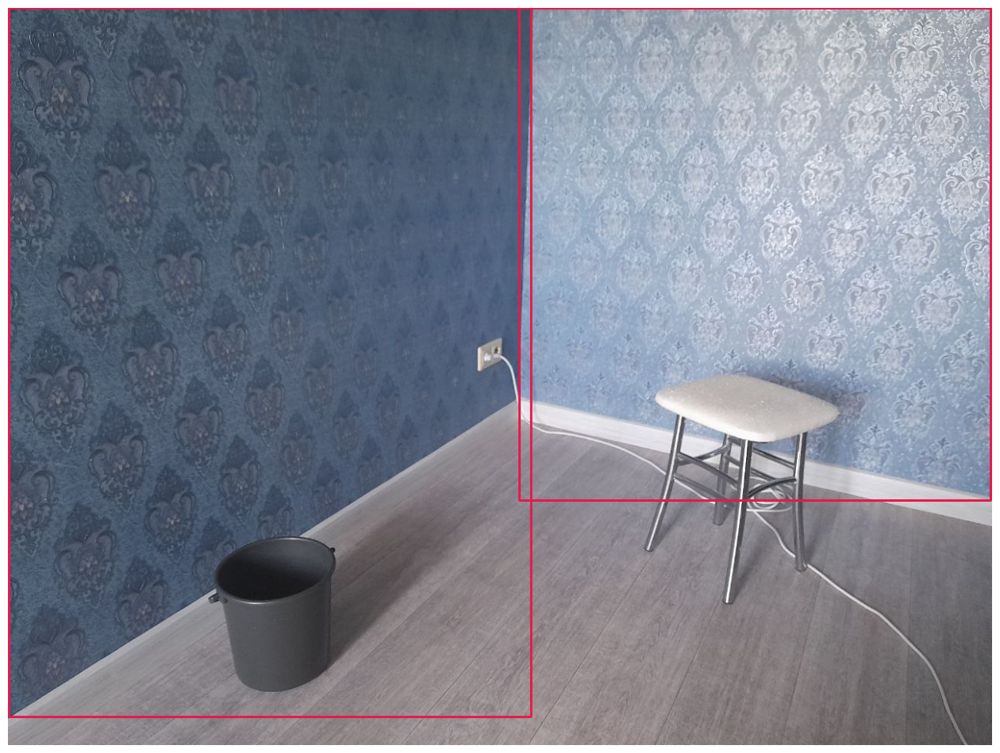

In [18]:
import cv2
import supervision as sv

# load image
image = cv2.imread(SOURCE_IMAGE_PATH)

# detect objects
detections = grounding_dino_model.predict_with_classes(
    image=image,
    classes=enhance_class_name(class_names=CLASSES),
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}" 
    for _, _, confidence, class_id, _ 
    in detections]
annotated_frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))

In [19]:
import numpy as np
from segment_anything import SamPredictor


def segment(sam_predictor: SamPredictor, image: np.ndarray, xyxy: np.ndarray) -> np.ndarray:
    sam_predictor.set_image(image)
    result_masks = []
    for box in xyxy:
        masks, scores, logits = sam_predictor.predict(
            box=box,
            multimask_output=True
        )
        index = np.argmax(scores)
        result_masks.append(masks[index])
    return np.array(result_masks)

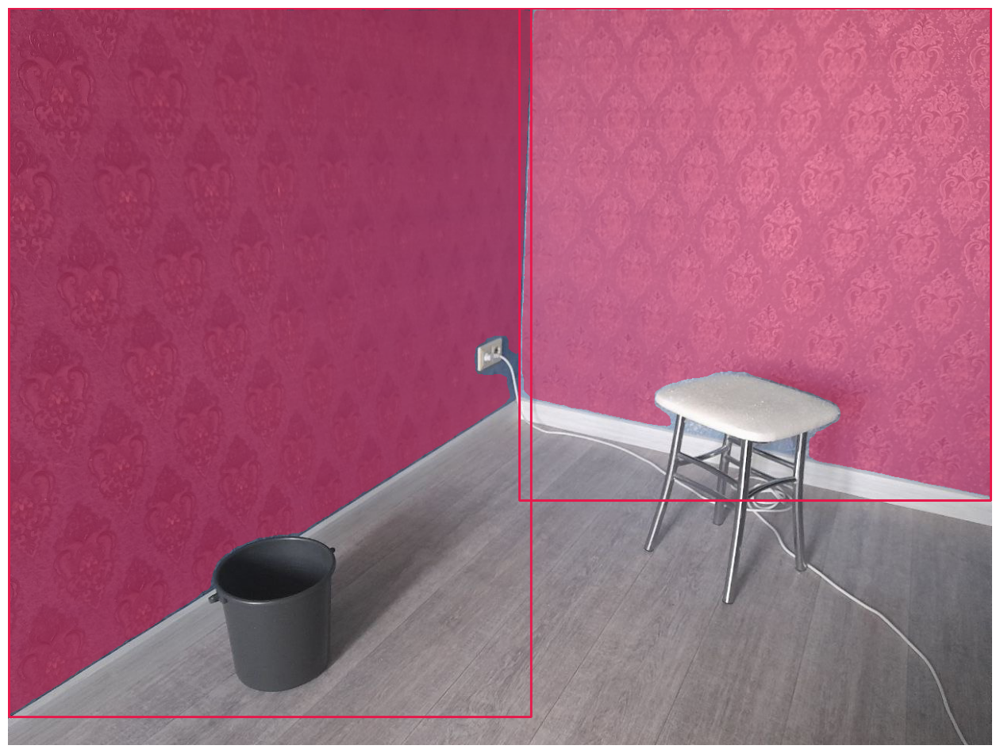

In [20]:
import cv2

# convert detections to masks
detections.mask = segment(
    sam_predictor=sam_predictor,
    image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB),
    xyxy=detections.xyxy
)

# annotate image with detections
box_annotator = sv.BoxAnnotator()
mask_annotator = sv.MaskAnnotator()
labels = [
    f"{CLASSES[class_id]} {confidence:0.2f}" 
    for _, _, confidence, class_id, _ 
    in detections]
annotated_image = mask_annotator.annotate(scene=image.copy(), detections=detections)
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_image, (16, 16))

In [21]:
height, width, channels = annotated_image.shape

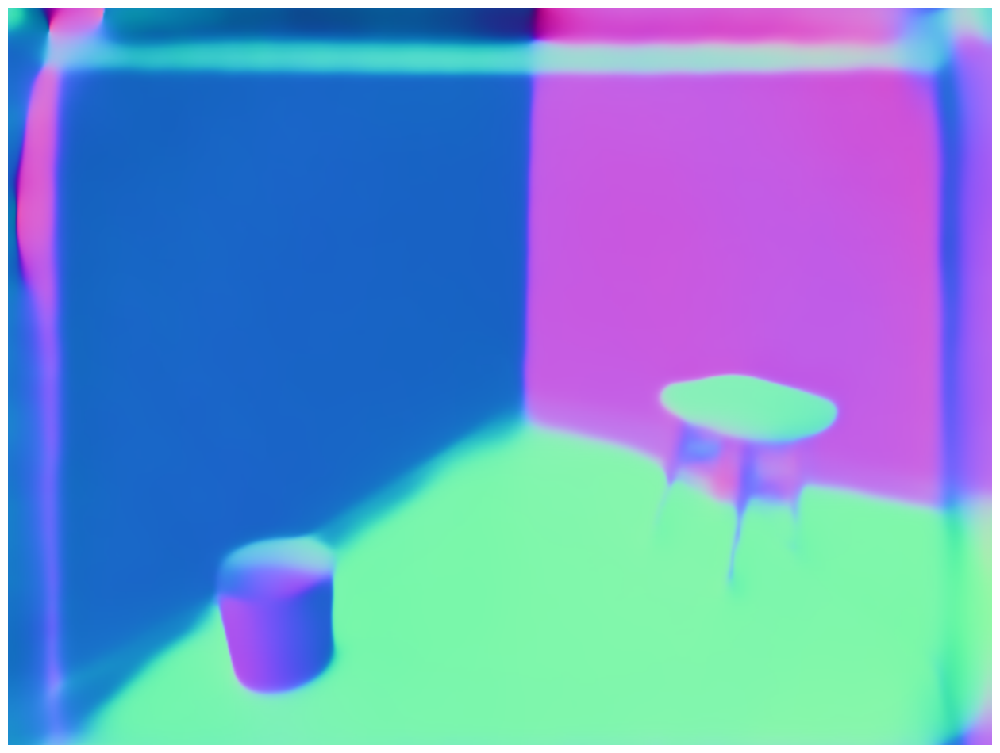

In [22]:
normals_image = cv2.imread('./examples/results/examples/102_pred_norm.png')
normals_image = cv2.resize(normals_image, (width, height))
sv.plot_image(normals_image, (16, 16))

In [23]:
normals = []
for mask_index in range(detections.mask.shape[0]):
    normal_of_a_single_wall = []
    for channel in range(normals_image.shape[-1]):
        normal_of_a_single_wall.append(np.median(normals_image[:,:,channel][detections.mask[mask_index] != 0]))
    normal_of_a_single_wall = np.array(normal_of_a_single_wall)
    normal_of_a_single_wall = normal_of_a_single_wall/np.sqrt(np.dot(normal_of_a_single_wall, normal_of_a_single_wall.T))
    normals.append(normal_of_a_single_wall)

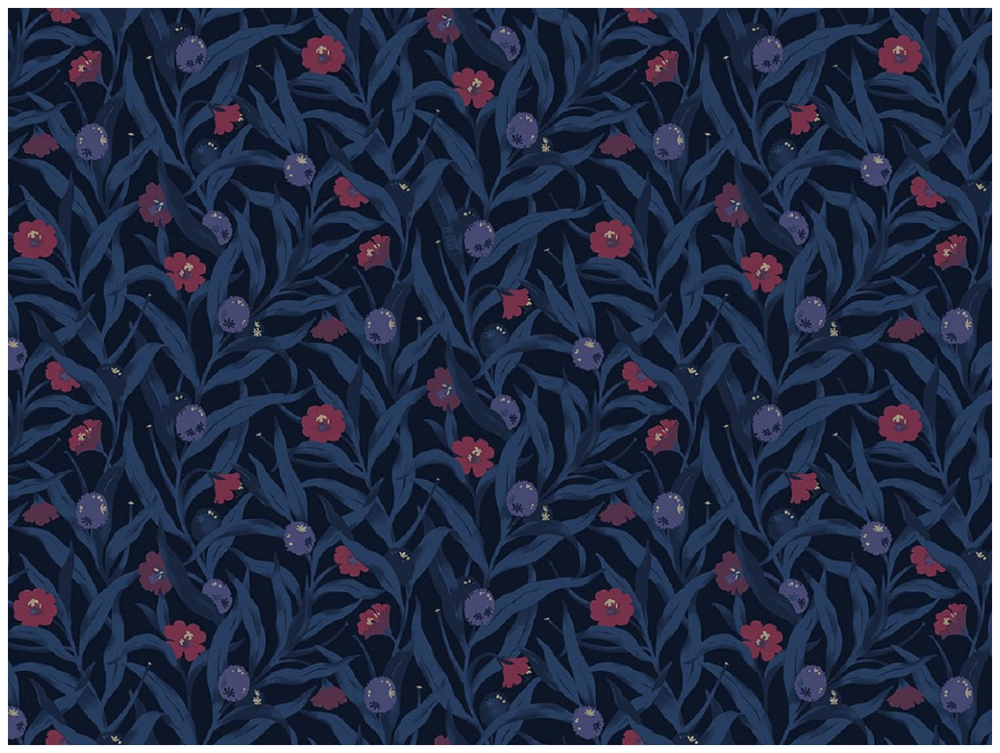

In [24]:
wallpaper = cv2.imread('./examples/sample_wallpaper_5.jpg')
wallpaper = cv2.resize(wallpaper, (width, height))
sv.plot_image(wallpaper, (16, 16))

In [26]:
projs_of_normals = []
for normal in normals:
    proj_of_normal = normal - np.dot(normal, np.array((0,0,1)).T)*np.array((0,0,1)).T
    proj_of_normal = proj_of_normal/proj_of_normal[:2].min()
    projs_of_normals.append(proj_of_normal)

In [22]:
normals = np.array(normals)
proj_of_normal_1 = normals[0] - np.dot(normals[0], np.array((0,0,1)).T)*np.array((0,0,1)).T
proj_of_normal_2 = normals[1] - np.dot(normals[1], np.array((0,0,1)).T)*np.array((0,0,1)).T
proj_of_normal_1 = proj_of_normal_1/proj_of_normal_1[:2].min()
proj_of_normal_2 = proj_of_normal_2/proj_of_normal_2[:2].min()

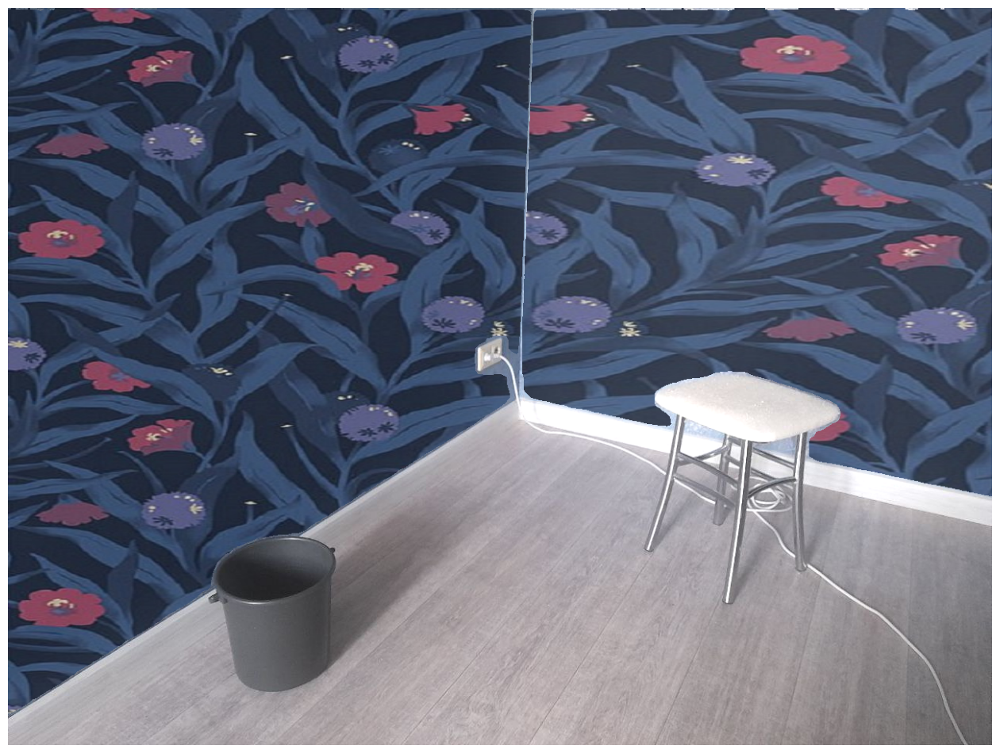

In [35]:
modified_image = np.copy(image)

for i in range(len(projs_of_normals)):
    scaled_image = cv2.resize(wallpaper, None, fx=projs_of_normals[i][0], fy=projs_of_normals[i][1], interpolation=cv2.INTER_LINEAR)
    
    image_brightness = (image/np.sqrt((image*image).sum())).sum(axis = 2)
    
    image_brightness_blurred = cv2.blur(image_brightness, (91, 91))
    
    
    scaled_image = scaled_image[:height, :width, :]
    
    modified_image[detections.mask[i] == True] = scaled_image[detections.mask[i] == True]
    
    normalized_mask = image_brightness_blurred
    mask_3channel = cv2.merge([normalized_mask, normalized_mask, normalized_mask])

    # Prepare the brightness adjustment (this can be adjusted)
    brightness_value = 1500  # The maximum amount of brightness to add

    # Apply the brightness adjustment according to the mask
    brightened_image = modified_image + (brightness_value * mask_3channel)

    # Clip the values to stay within valid range [0, 255]
    brightened_image = np.clip(brightened_image, 0, 255).astype(np.uint8)
    
sv.plot_image(brightened_image, (16, 16))

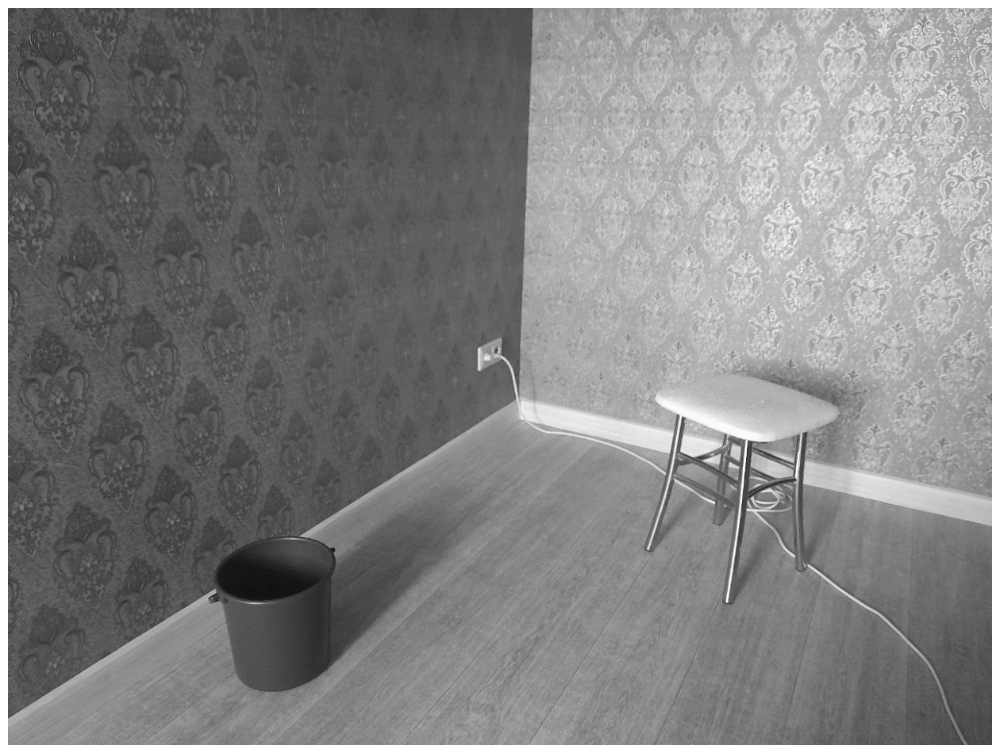

In [34]:
sv.plot_image(image_brightness, (16, 16))

In [35]:
image_brightness_blurred = cv2.blur(image_brightness, (91, 91))

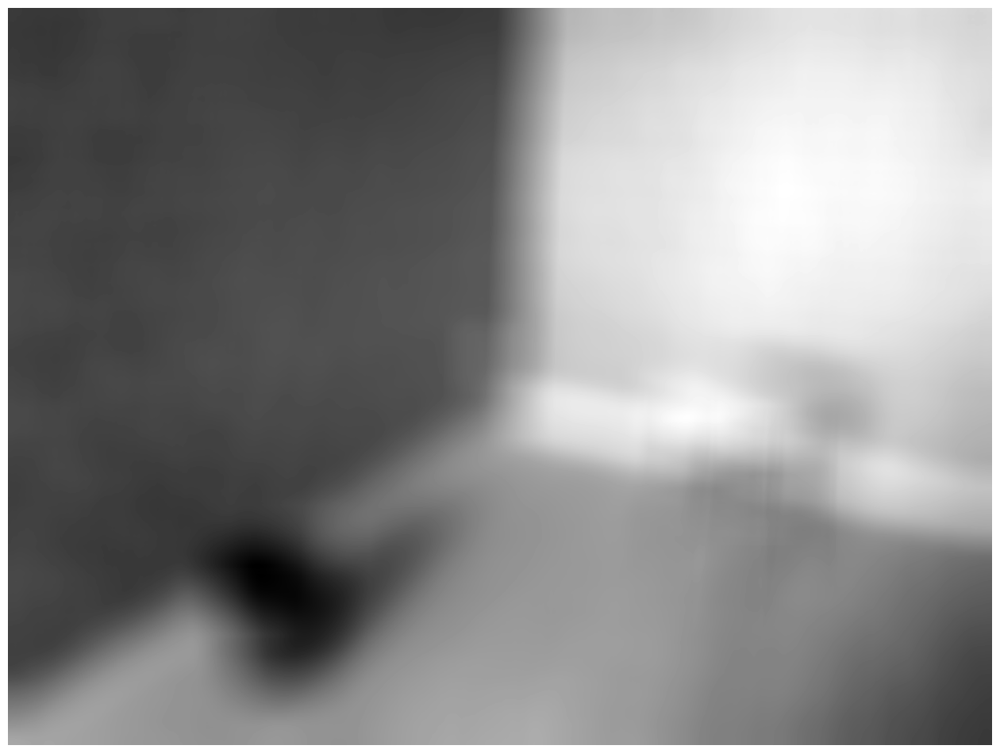

In [36]:
sv.plot_image(image_brightness_blurred, (16, 16))

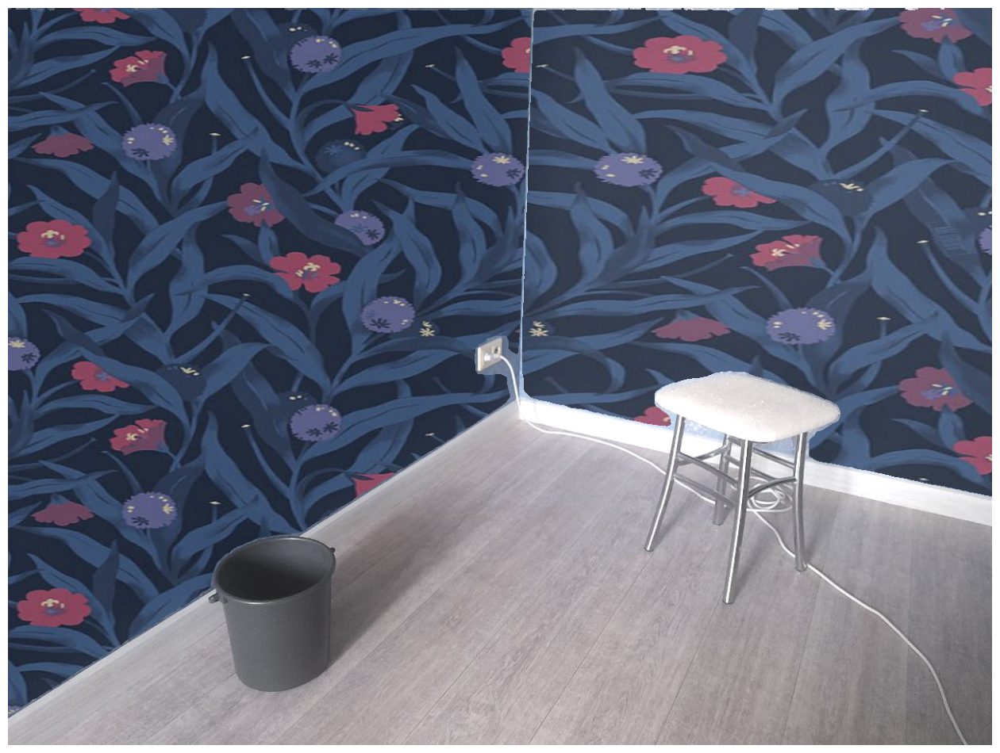

In [37]:
normalized_mask = image_brightness_blurred
mask_3channel = cv2.merge([normalized_mask, normalized_mask, normalized_mask])

# Prepare the brightness adjustment (this can be adjusted)
brightness_value = 1500  # The maximum amount of brightness to add

# Apply the brightness adjustment according to the mask
brightened_image = modified_image + (brightness_value * mask_3channel)

# Clip the values to stay within valid range [0, 255]
brightened_image = np.clip(brightened_image, 0, 255).astype(np.uint8)

# Save or display the brightened image
sv.plot_image(brightened_image, (16, 16))